<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/GPU_Accelerated_HR_TEM_ADF_STEM_with_abTEM_%2B_CuPy_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [ ]:
!uv pip install abtem
!uv pip install cupy-cuda12x

abTEM version: 1.0.10
CuPy version: 14.0.1
GPU: NVIDIA L4

GaN specimen
Atoms: 2,880
Cell x: 25.491 A
Cell y: 44.152 A
Thickness: 31.220 A
Zone axis: (1, 1, 1)


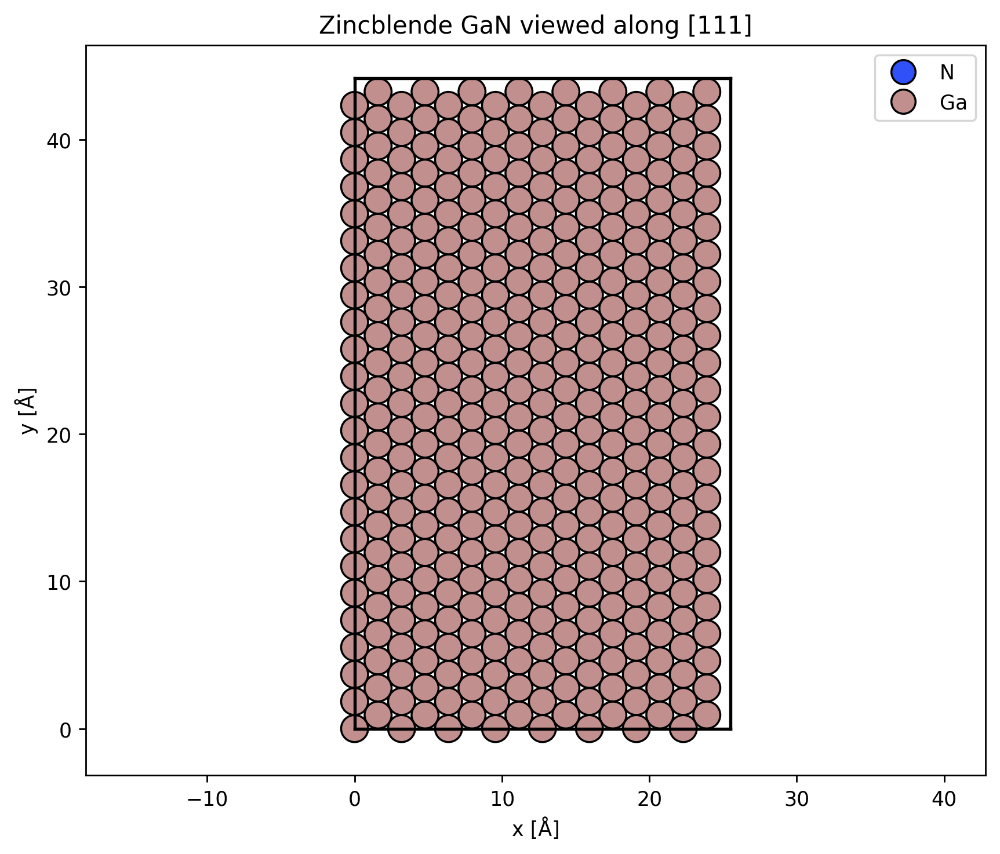


Potential
Grid sampling: (0.04998218944914228, 0.049945206691988944)
Number of slices: 32
Thickness: 31.220 A
[########################################] | 100% Completed | 5.33 s


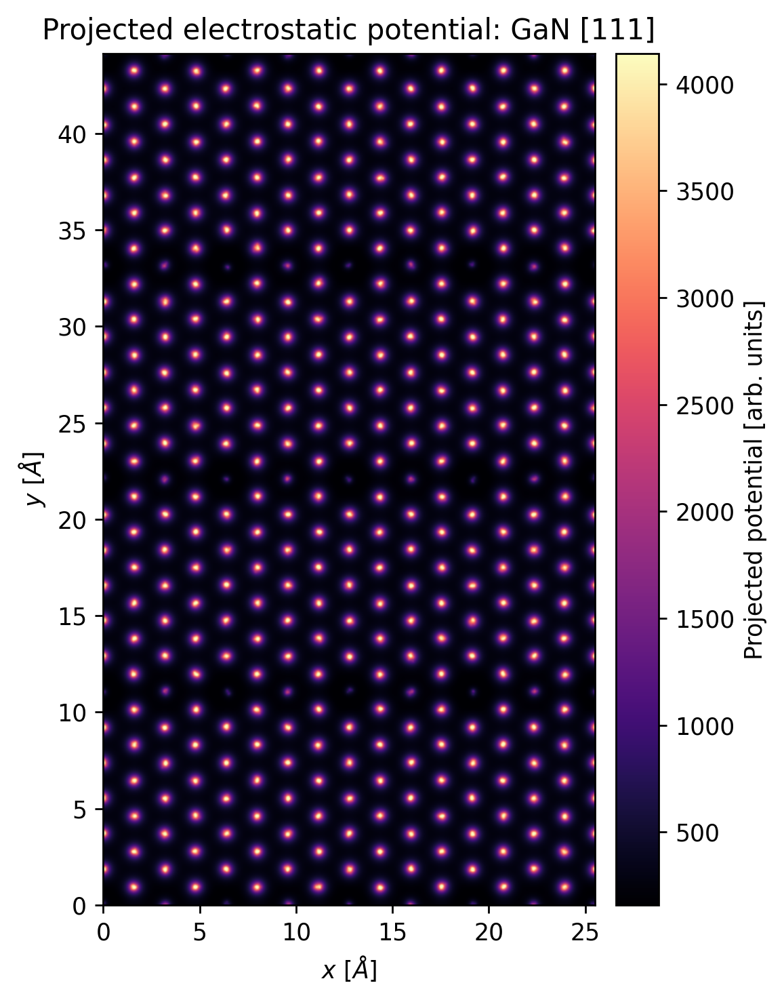


Running HRTEM multislice simulation...
Scherzer defocus: -54.859 A
Objective aperture: 35.000 mrad
Focal spread: 17.500 A
[########################################] | 100% Completed | 5.85 s


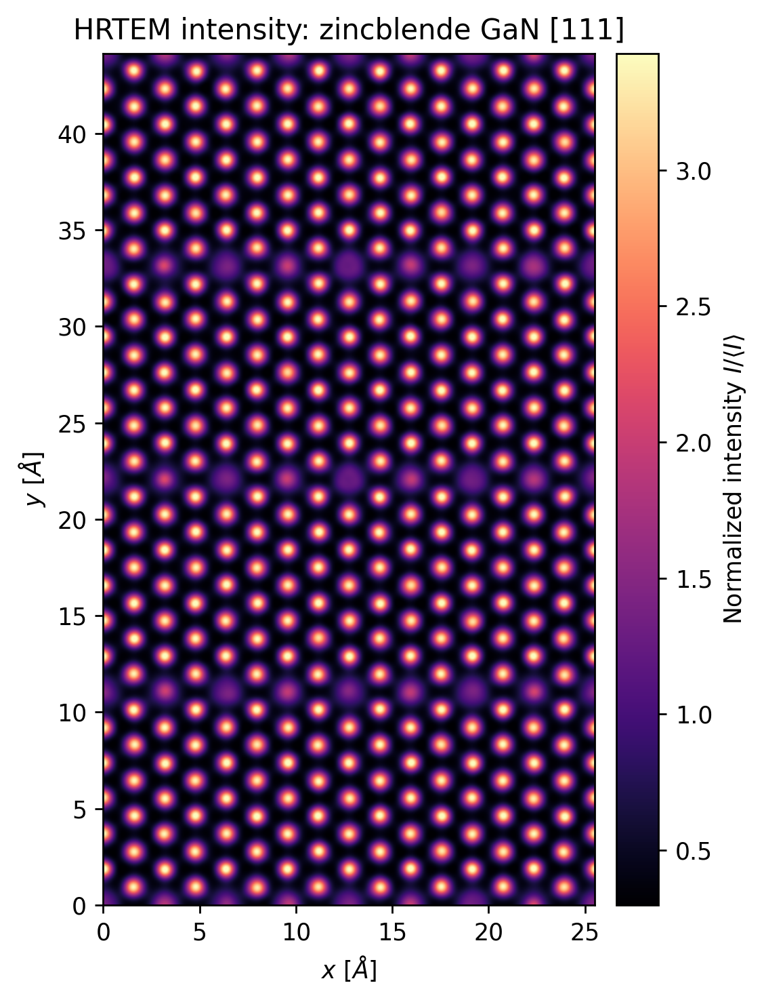


Running ADF-STEM scan...
Probe semiangle: 25.0 mrad
Scan sampling: 0.2508 A
ADF detector: 70.0 to 180.0 mrad
[########################################] | 100% Completed | 538.57 s


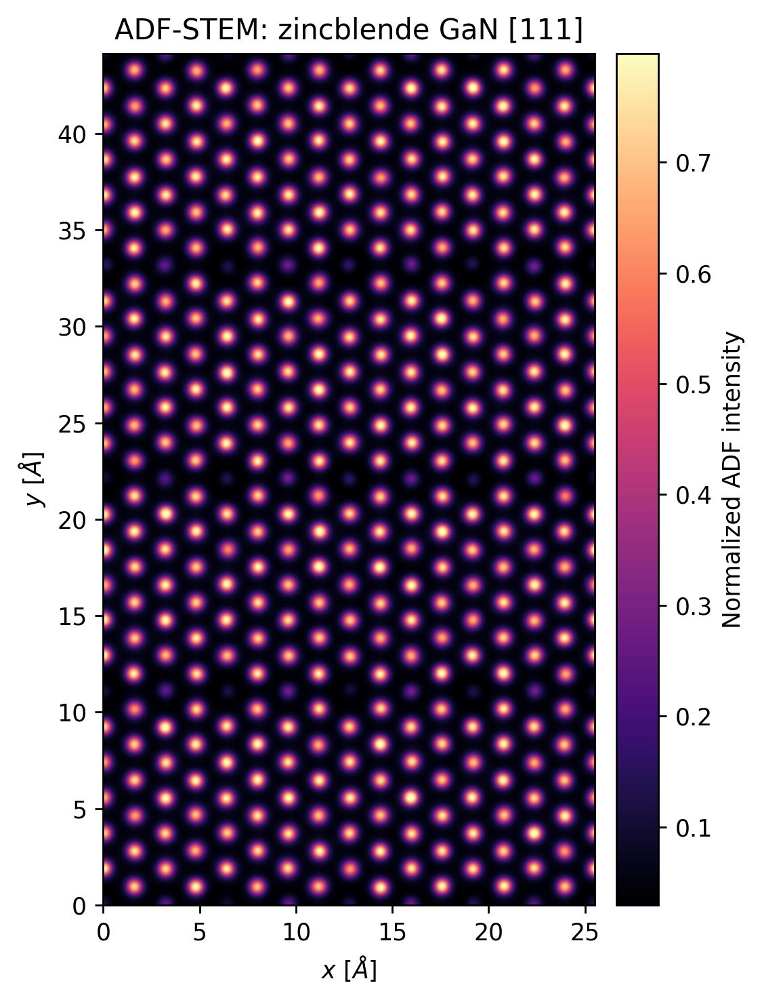

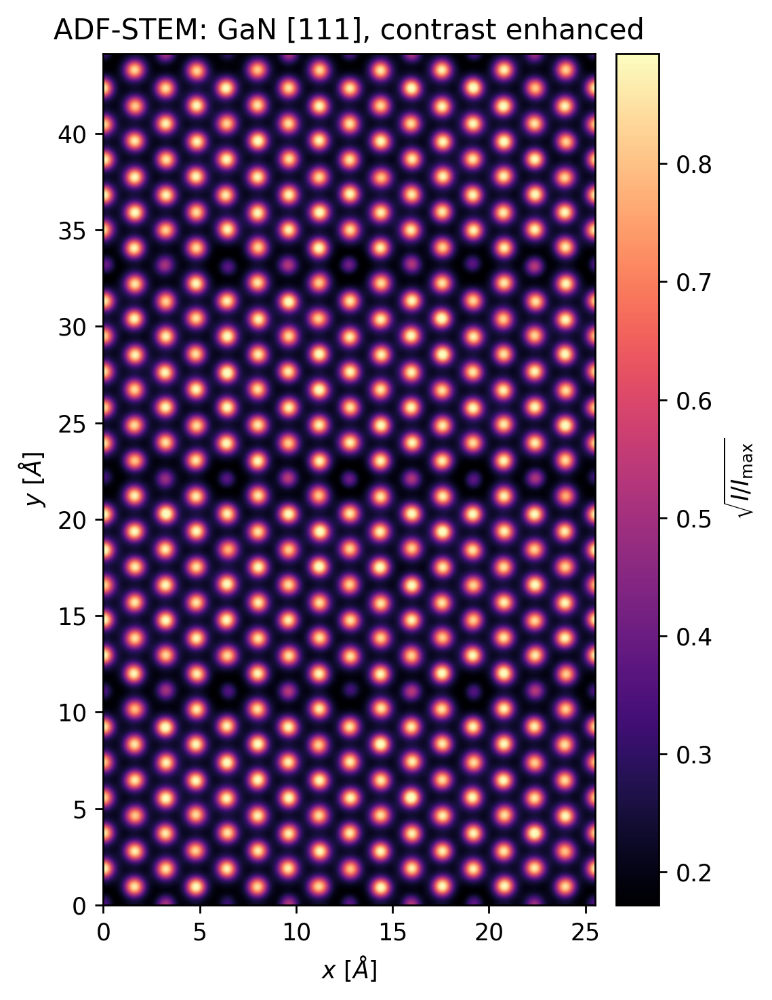


Simulation complete.
HRTEM image shape: (510, 884)
ADF-STEM image shape: (255, 442)
GPU memory currently used: 0.010 GiB


In [2]:
"""Simulate [111] GaN HRTEM and ADF-STEM images with abTEM and CuPy."""

import gc

import abtem
import cupy as cp
import dask
import matplotlib.pyplot as plt
import numpy as np
from ase.build import bulk, surface


# ---------------------------------------------------------------------------
# Control knobs
# ---------------------------------------------------------------------------

# Crystal
GAN_PHASE = "zincblende"
GAN_LATTICE_A = 4.5062  # Angstrom
ZONE_AXIS = (1, 1, 1)
SURFACE_LAYERS = 12
REPEAT_X = 4
REPEAT_Y = 4
ORTHOGONAL_MAX_REPETITIONS = 6

# Electron optics
ENERGY_EV = 200_000.0

# Multislice potential
POTENTIAL_SAMPLING_A = 0.05
SLICE_THICKNESS_A = 1.0
POTENTIAL_PROJECTION = "infinite"

# Thermal diffuse scattering
USE_FROZEN_PHONONS = True
NUM_FROZEN_PHONONS = 4
PHONON_SIGMA_A = {
    "Ga": 0.075,
    "N": 0.075,
}
RANDOM_SEED = 42

# HRTEM objective lens
HRTEM_CS_A = -8.0e-6 * 1.0e10  # -8 micrometers in Angstrom
HRTEM_DEFOCUS = "scherzer"
HRTEM_APERTURE_MRAD = 35.0
CHROMATIC_ABERRATION_A = 1.0e-3 * 1.0e10  # 1 mm
ENERGY_SPREAD_EV = 0.35

# STEM probe
PROBE_SEMIANGLE_MRAD = 25.0
ADF_INNER_MRAD = 70.0
ADF_OUTER_MRAD = 180.0

# None uses the probe Nyquist sampling automatically.
STEM_SCAN_SAMPLING_A = None

# Smooth display grid without pretending to add physical resolution.
OUTPUT_PIXEL_SIZE_A = 0.10

# Optional finite source broadening.
SOURCE_SIZE_SIGMA_A = 0.15

# GPU
DEVICE = "gpu"
GPU_CHUNK_SIZE = "1024 MB"
NUM_DASK_WORKERS = 1

# Plotting
FIGURE_DPI = 250
HEATMAP_CMAP = "magma"
LOW_PERCENTILE = 0.5
HIGH_PERCENTILE = 99.5
SAVE_PNG = True
SAVE_ARRAYS = True

plt.rcParams["figure.dpi"] = FIGURE_DPI
plt.rcParams["savefig.dpi"] = FIGURE_DPI


# ---------------------------------------------------------------------------
# Runtime configuration
# ---------------------------------------------------------------------------

abtem.config.set(
    {
        "device": DEVICE,
        "dask.chunk-size-gpu": GPU_CHUNK_SIZE,
        "diagnostics.progress_bar": True,
    }
)

dask.config.set({"num_workers": NUM_DASK_WORKERS})

print(f"abTEM version: {abtem.__version__}")
print(f"CuPy version: {cp.__version__}")
print(f"GPU: {cp.cuda.runtime.getDeviceProperties(0)['name'].decode()}")


# ---------------------------------------------------------------------------
# Atomic structure
# ---------------------------------------------------------------------------

def build_gan_111() -> object:
    """Build an orthogonal zincblende GaN specimen viewed along [111]."""
    if GAN_PHASE != "zincblende":
        raise ValueError(
            "This [111] workflow currently assumes cubic zincblende GaN."
        )

    conventional_cell = bulk(
        "GaN",
        crystalstructure="zincblende",
        a=GAN_LATTICE_A,
        cubic=True,
    )

    oriented_slab = surface(
        conventional_cell,
        indices=ZONE_AXIS,
        layers=SURFACE_LAYERS,
        periodic=True,
    )

    oriented_slab = abtem.orthogonalize_cell(
        oriented_slab,
        max_repetitions=ORTHOGONAL_MAX_REPETITIONS,
    )

    atoms = oriented_slab.repeat((REPEAT_X, REPEAT_Y, 1))
    atoms.wrap()

    return atoms


atoms = build_gan_111()

cell_lengths = atoms.cell.lengths()
lx, ly, lz = cell_lengths

print("\nGaN specimen")
print(f"Atoms: {len(atoms):,}")
print(f"Cell x: {lx:.3f} A")
print(f"Cell y: {ly:.3f} A")
print(f"Thickness: {lz:.3f} A")
print(f"Zone axis: {ZONE_AXIS}")


# ---------------------------------------------------------------------------
# Verify the projected structure
# ---------------------------------------------------------------------------

fig, ax = plt.subplots(figsize=(7.0, 6.0), dpi=FIGURE_DPI)

abtem.show_atoms(
    atoms,
    plane="xy",
    ax=ax,
    legend=True,
    title="Zincblende GaN viewed along [111]",
)

fig.tight_layout()

if SAVE_PNG:
    fig.savefig(
        "gan_111_atomic_projection.png",
        bbox_inches="tight",
    )

plt.show()


# ---------------------------------------------------------------------------
# Frozen phonons and electrostatic potential
# ---------------------------------------------------------------------------

if USE_FROZEN_PHONONS:
    specimen = abtem.FrozenPhonons(
        atoms,
        num_configs=NUM_FROZEN_PHONONS,
        sigmas=PHONON_SIGMA_A,
        seed=RANDOM_SEED,
        ensemble_mean=True,
    )
else:
    specimen = atoms

potential = abtem.Potential(
    specimen,
    sampling=POTENTIAL_SAMPLING_A,
    projection=POTENTIAL_PROJECTION,
    slice_thickness=SLICE_THICKNESS_A,
)

print("\nPotential")
print(f"Grid sampling: {potential.sampling}")
print(f"Number of slices: {potential.num_slices}")
print(f"Thickness: {potential.thickness:.3f} A")


# ---------------------------------------------------------------------------
# Utility functions
# ---------------------------------------------------------------------------

def reduce_to_2d(measurement: object) -> object:
    """Average ensemble dimensions until a two-dimensional image remains."""
    reduced = measurement

    while len(reduced.shape) > 2:
        reduced = reduced.mean(0)

    return reduced.compute()


def to_numpy(measurement: object) -> np.ndarray:
    """Copy an abTEM measurement array to a NumPy array."""
    array = measurement.array

    if hasattr(array, "compute"):
        array = array.compute()

    if isinstance(array, cp.ndarray):
        array = cp.asnumpy(array)

    return np.asarray(array)


def plot_heatmap(
    data: np.ndarray,
    title: str,
    colorbar_label: str,
    filename: str,
    normalize: bool = False,
) -> None:
    """Plot an atomic-resolution heatmap with robust intensity scaling."""
    image = np.asarray(data, dtype=np.float64)

    if normalize:
        maximum = np.nanmax(image)
        if maximum > 0.0:
            image = image / maximum

    finite = image[np.isfinite(image)]

    vmin = np.percentile(finite, LOW_PERCENTILE)
    vmax = np.percentile(finite, HIGH_PERCENTILE)

    fig, ax = plt.subplots(
        figsize=(7.2, 6.0),
        dpi=FIGURE_DPI,
    )

    render = ax.imshow(
        image.T,
        origin="lower",
        extent=(0.0, lx, 0.0, ly),
        interpolation="bicubic",
        cmap=HEATMAP_CMAP,
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    ax.set_title(title)
    ax.set_xlabel(r"$x$ [$\AA$]")
    ax.set_ylabel(r"$y$ [$\AA$]")

    colorbar = fig.colorbar(
        render,
        ax=ax,
        pad=0.02,
        fraction=0.046,
    )
    colorbar.set_label(colorbar_label)

    fig.tight_layout()

    if SAVE_PNG:
        fig.savefig(
            filename,
            bbox_inches="tight",
        )

    plt.show()


# ---------------------------------------------------------------------------
# Projected electrostatic potential heatmap
# ---------------------------------------------------------------------------

projected_potential = reduce_to_2d(potential.project())
potential_array = to_numpy(projected_potential)

plot_heatmap(
    potential_array,
    title="Projected electrostatic potential: GaN [111]",
    colorbar_label="Projected potential [arb. units]",
    filename="gan_111_projected_potential.png",
)


# ---------------------------------------------------------------------------
# HRTEM simulation
# ---------------------------------------------------------------------------

print("\nRunning HRTEM multislice simulation...")

plane_wave = abtem.PlaneWave(
    energy=ENERGY_EV,
)

exit_wave = plane_wave.multislice(potential)

ctf = abtem.CTF(
    Cs=HRTEM_CS_A,
    energy=ENERGY_EV,
    defocus=HRTEM_DEFOCUS,
)

ctf.semiangle_cutoff = min(
    HRTEM_APERTURE_MRAD,
    float(ctf.crossover_angle),
)

focal_spread = (
    CHROMATIC_ABERRATION_A
    * ENERGY_SPREAD_EV
    / ENERGY_EV
)

ctf.focal_spread = focal_spread

print(f"Scherzer defocus: {ctf.defocus:.3f} A")
print(f"Objective aperture: {ctf.semiangle_cutoff:.3f} mrad")
print(f"Focal spread: {focal_spread:.3f} A")

hrtem = exit_wave.apply_ctf(ctf).intensity()
hrtem = reduce_to_2d(hrtem)

hrtem_array = to_numpy(hrtem)

# Express HRTEM contrast relative to mean transmitted intensity.
hrtem_mean = np.mean(hrtem_array)

if hrtem_mean > 0.0:
    hrtem_normalized = hrtem_array / hrtem_mean
else:
    hrtem_normalized = hrtem_array

plot_heatmap(
    hrtem_normalized,
    title="HRTEM intensity: zincblende GaN [111]",
    colorbar_label=r"Normalized intensity $I/\langle I\rangle$",
    filename="gan_111_hrtem.png",
)

del exit_wave
gc.collect()
cp.get_default_memory_pool().free_all_blocks()


# ---------------------------------------------------------------------------
# ADF-STEM simulation
# ---------------------------------------------------------------------------

print("\nRunning ADF-STEM scan...")

probe = abtem.Probe(
    energy=ENERGY_EV,
    semiangle_cutoff=PROBE_SEMIANGLE_MRAD,
)

probe.grid.match(potential)

if STEM_SCAN_SAMPLING_A is None:
    scan_sampling = float(probe.aperture.nyquist_sampling)
else:
    scan_sampling = STEM_SCAN_SAMPLING_A

print(f"Probe semiangle: {PROBE_SEMIANGLE_MRAD:.1f} mrad")
print(f"Scan sampling: {scan_sampling:.4f} A")
print(
    f"ADF detector: {ADF_INNER_MRAD:.1f} to "
    f"{ADF_OUTER_MRAD:.1f} mrad"
)

scan = abtem.GridScan(
    start=(0.0, 0.0),
    end=(1.0, 1.0),
    sampling=scan_sampling,
    endpoint=False,
    fractional=True,
    potential=potential,
)

detector = abtem.AnnularDetector(
    inner=ADF_INNER_MRAD,
    outer=ADF_OUTER_MRAD,
    to_cpu=True,
)

adf = probe.scan(
    potential,
    scan=scan,
    detectors=detector,
)

adf = reduce_to_2d(adf)

# Fourier interpolation improves the display sampling without asserting
# additional physical information beyond the simulated probe bandwidth.
adf = adf.interpolate(sampling=OUTPUT_PIXEL_SIZE_A)

if SOURCE_SIZE_SIGMA_A > 0.0:
    adf = adf.gaussian_filter(SOURCE_SIZE_SIGMA_A)

adf = adf.compute()
adf_array = to_numpy(adf)

plot_heatmap(
    adf_array,
    title="ADF-STEM: zincblende GaN [111]",
    colorbar_label="Normalized ADF intensity",
    filename="gan_111_adf_stem.png",
    normalize=True,
)


# ---------------------------------------------------------------------------
# Contrast-enhanced ADF heatmap
# ---------------------------------------------------------------------------

adf_normalized = adf_array / np.max(adf_array)

# Square-root scaling reveals weaker atomic-column intensity without
# changing the underlying simulated signal.
adf_contrast_enhanced = np.sqrt(
    np.clip(adf_normalized, 0.0, None)
)

plot_heatmap(
    adf_contrast_enhanced,
    title="ADF-STEM: GaN [111], contrast enhanced",
    colorbar_label=r"$\sqrt{I/I_{\max}}$",
    filename="gan_111_adf_stem_contrast_enhanced.png",
)


# ---------------------------------------------------------------------------
# Save numerical results
# ---------------------------------------------------------------------------

if SAVE_ARRAYS:
    np.savez_compressed(
        "gan_111_hrtem_adf_stem.npz",
        projected_potential=potential_array,
        hrtem=hrtem_normalized,
        adf_stem=adf_array,
        cell_lengths_a=np.asarray(cell_lengths),
        energy_ev=ENERGY_EV,
        zone_axis=np.asarray(ZONE_AXIS),
        gan_lattice_a=GAN_LATTICE_A,
        adf_inner_mrad=ADF_INNER_MRAD,
        adf_outer_mrad=ADF_OUTER_MRAD,
        probe_semiangle_mrad=PROBE_SEMIANGLE_MRAD,
    )


# ---------------------------------------------------------------------------
# Diagnostics
# ---------------------------------------------------------------------------

print("\nSimulation complete.")
print(f"HRTEM image shape: {hrtem_array.shape}")
print(f"ADF-STEM image shape: {adf_array.shape}")
print(
    "GPU memory currently used: "
    f"{cp.get_default_memory_pool().used_bytes() / 2**30:.3f} GiB"
)

abTEM: 1.0.10
CuPy: 14.0.1
GPU: NVIDIA L4

GaN [110] specimen
Atoms: 1,536
Cell: 25.491 × 18.025 × 38.236 Å
Zone axis: (1, 1, 0)


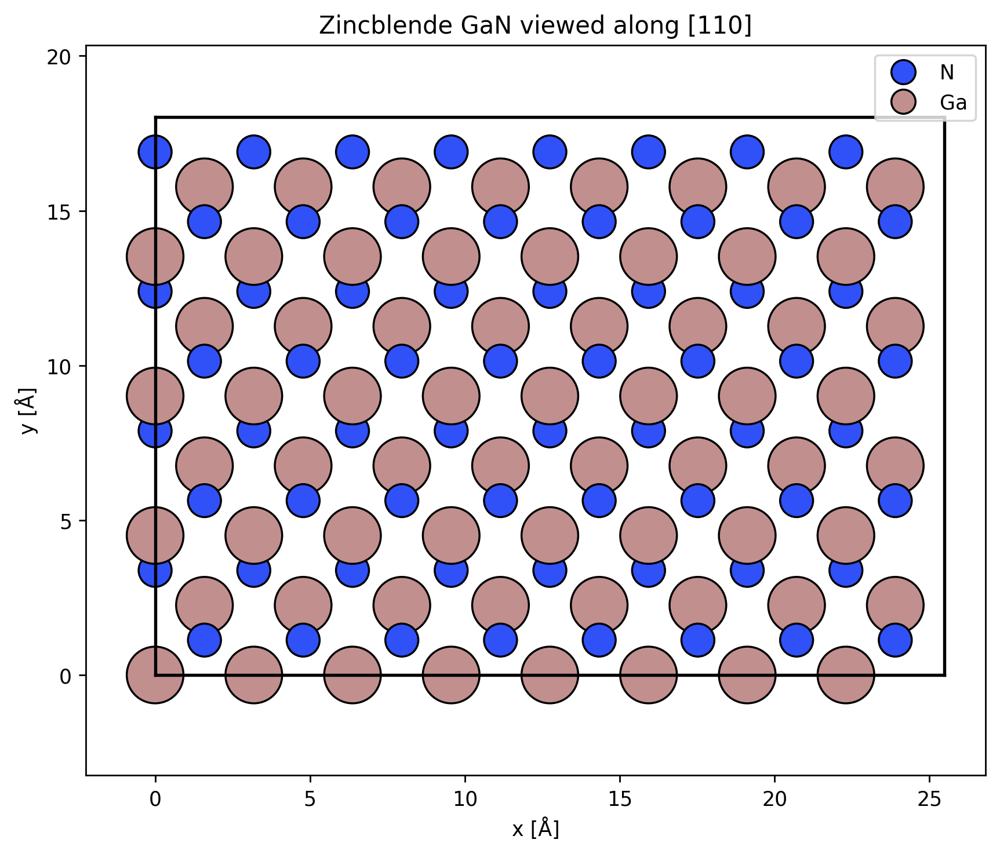


Potential
Sampling: (0.04998218944914228, 0.04993019390581717)
Slices: 39
Thickness: 38.236 Å
[########################################] | 100% Completed | 709.57 ms


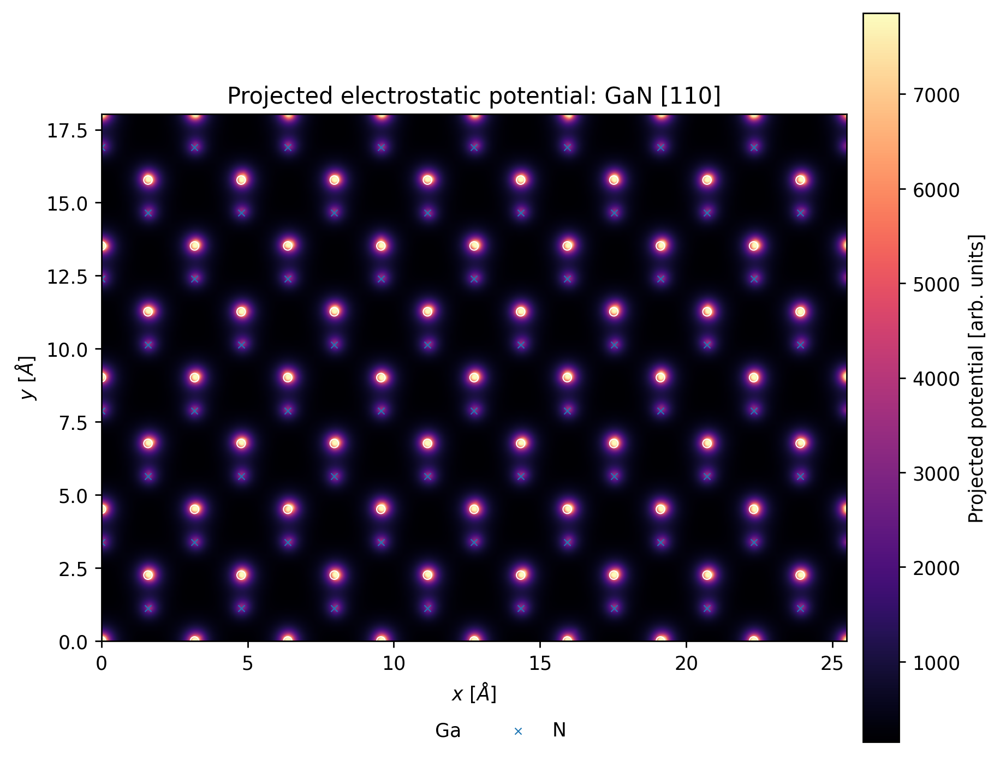


Running HRTEM multislice calculation...
[########################################] | 100% Completed | 912.52 ms


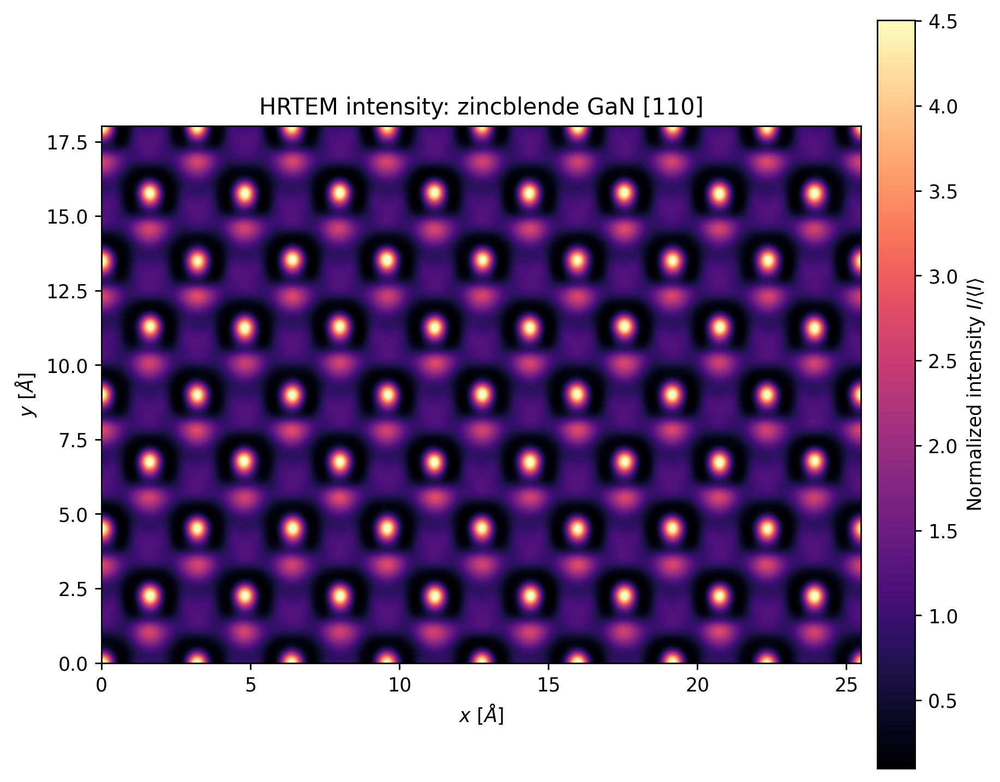


Running annular STEM calculation...
[########################################] | 100% Completed | 115.01 s

Polar detector
Shape: (102, 72, 166, 1)
Radial sampling: 1.000 mrad
Radial offset: 0.000 mrad
Maximum available scattering angle: 166.000 mrad

Effective detector windows
BF: 0.0 to 30.0 mrad
MAADF: 50.0 to 120.0 mrad
HAADF: 90.0 to 166.0 mrad


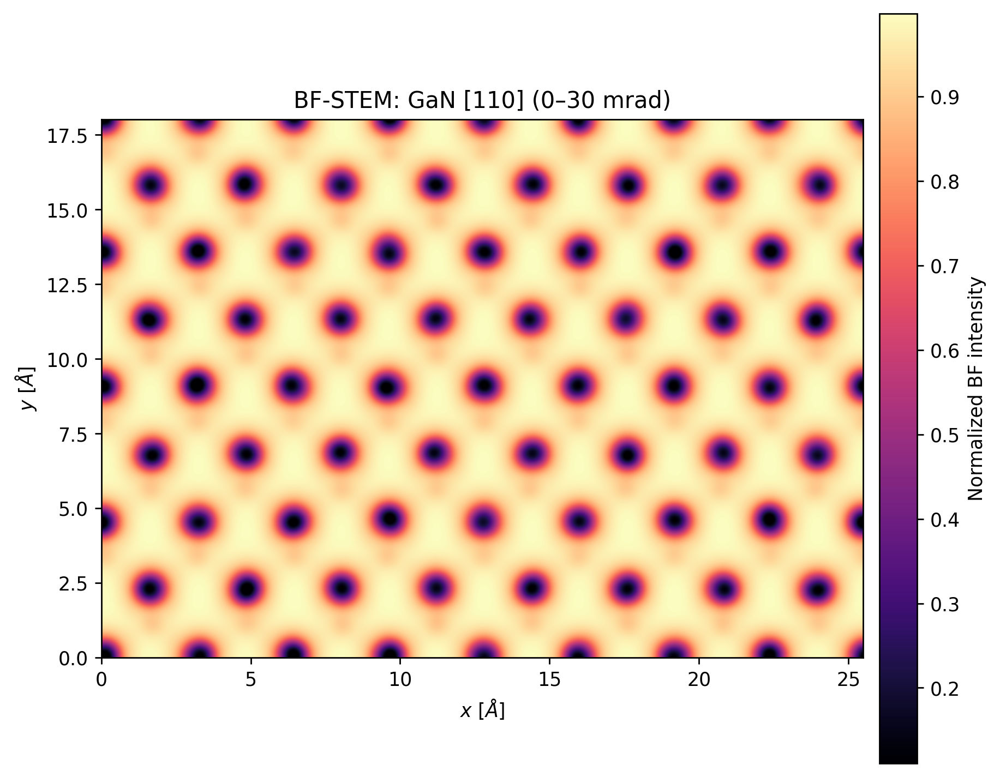

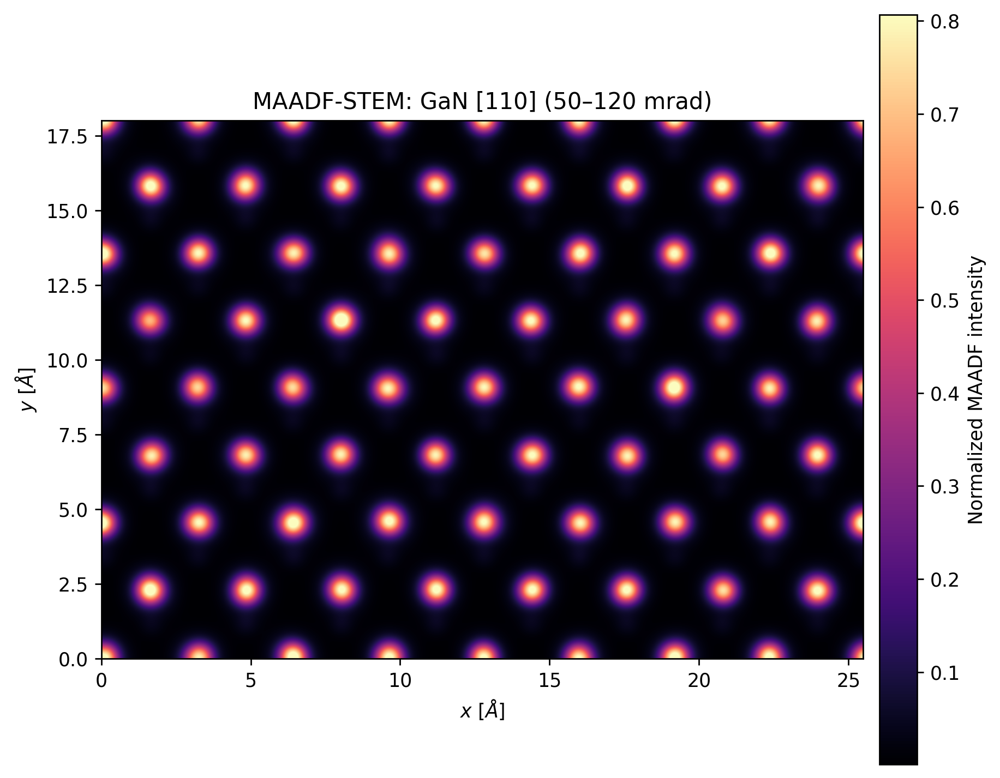

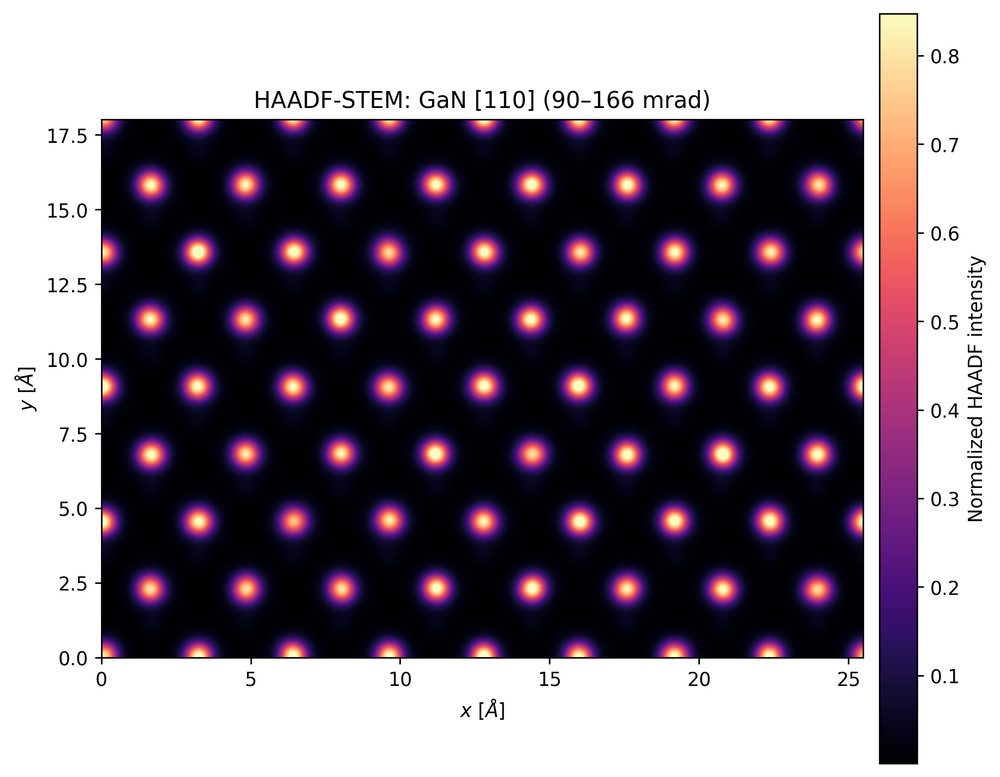

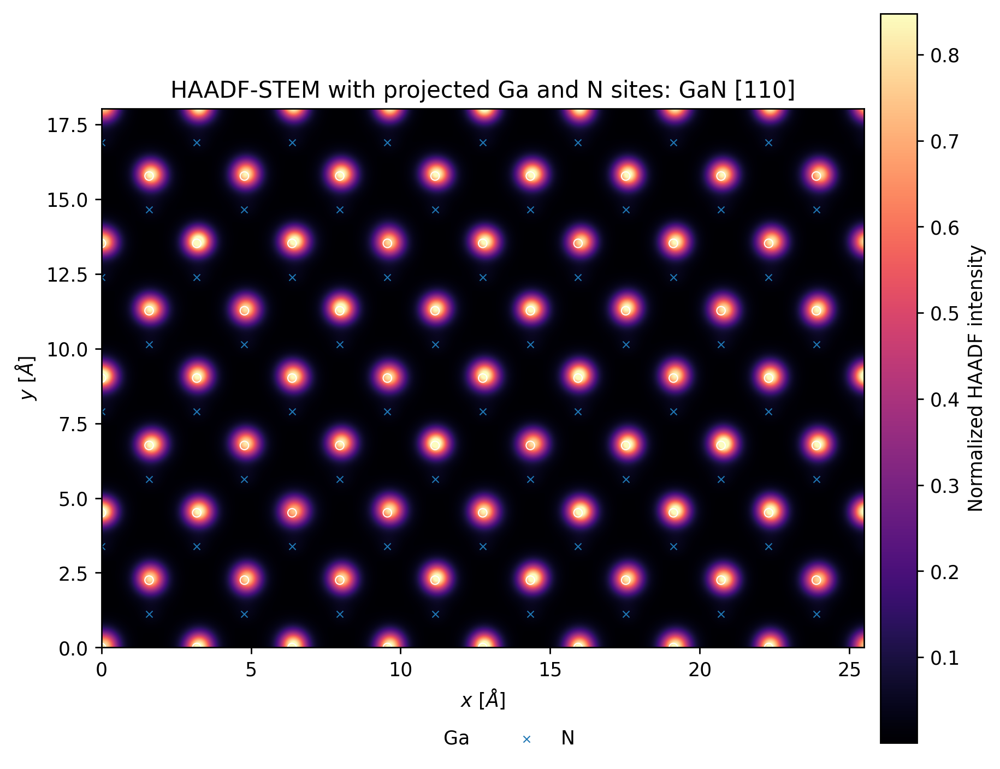

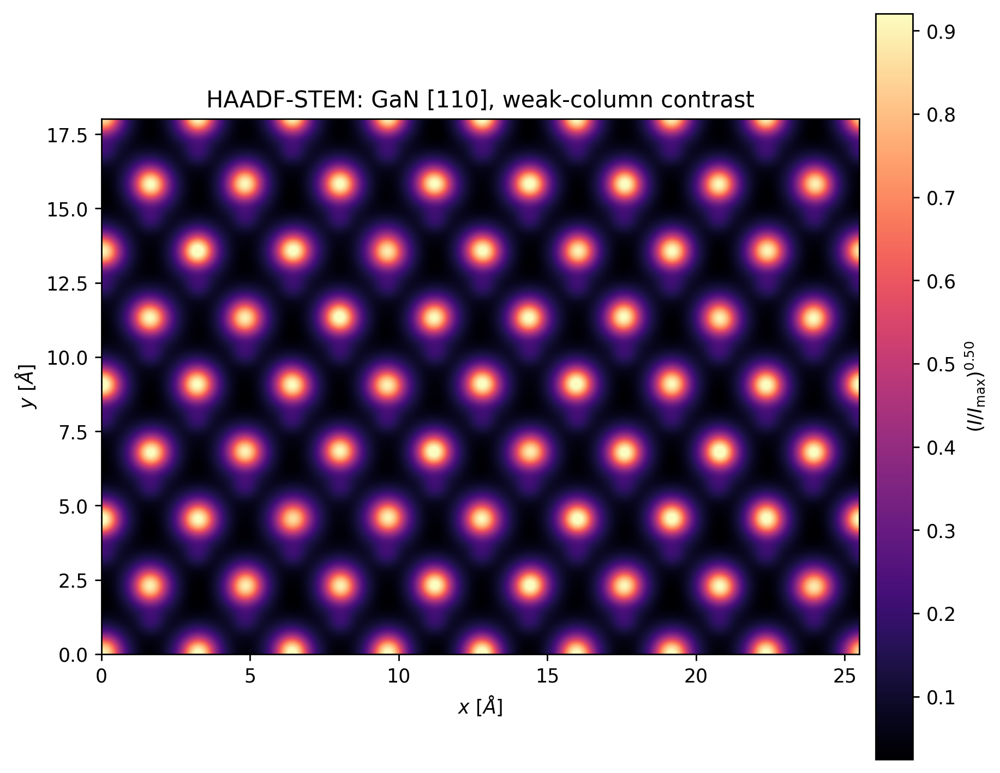

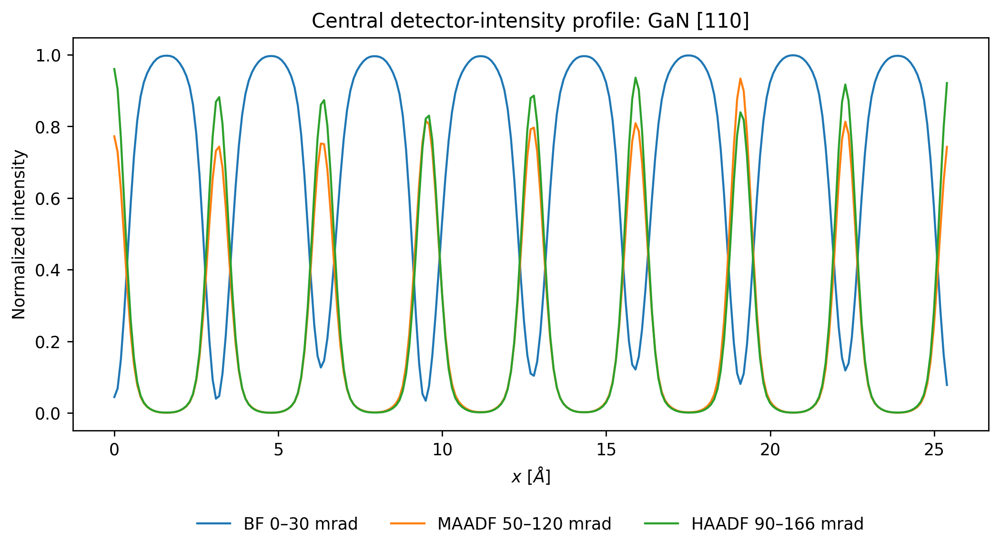

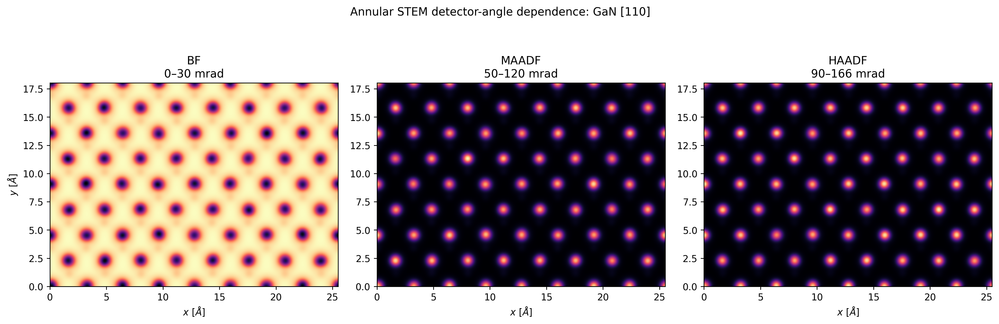

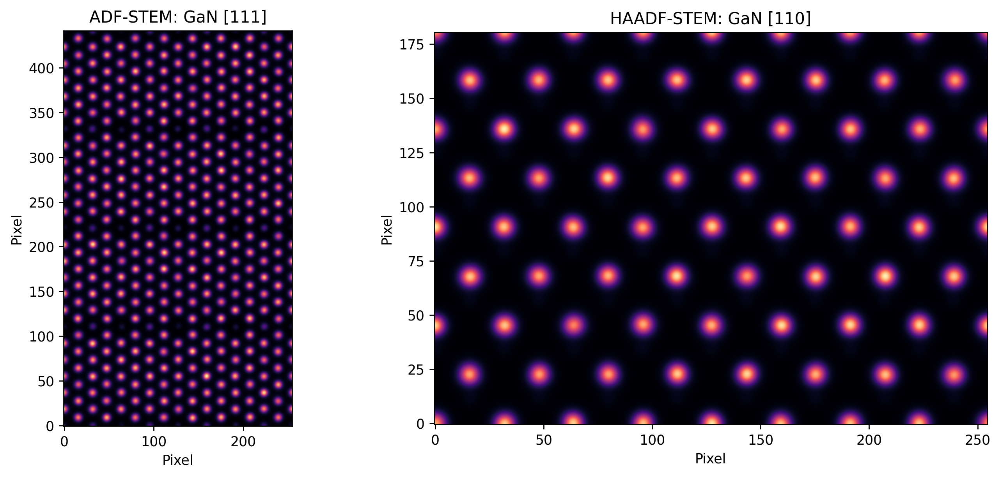


Simulation complete.
HRTEM array: (510, 361)
BF-STEM array: (255, 181)
MAADF-STEM array: (255, 181)
HAADF-STEM array: (255, 181)
Maximum simulated detector angle: 166.00 mrad
GPU memory pool in use: 0.014 GiB


In [4]:
"""Simulate HRTEM and annular STEM imaging of zincblende GaN along [110]."""

import gc

import abtem
import cupy as cp
import dask
import matplotlib.pyplot as plt
import numpy as np
from ase.build import bulk, surface


# ---------------------------------------------------------------------------
# Control knobs
# ---------------------------------------------------------------------------

# Crystal.
GAN_LATTICE_A = 4.5062
ZONE_AXIS = (1, 1, 0)
SURFACE_LAYERS = 12
REPEAT_X = 4
REPEAT_Y = 4
ORTHOGONAL_MAX_REPETITIONS = 8

# Electron optics.
ENERGY_EV = 200_000.0
PROBE_SEMIANGLE_MRAD = 25.0

# Electrostatic potential.
POTENTIAL_SAMPLING_A = 0.05
SLICE_THICKNESS_A = 1.0
POTENTIAL_PROJECTION = "infinite"

# Frozen phonons.
USE_FROZEN_PHONONS = True
NUM_FROZEN_PHONONS = 4
PHONON_SIGMA_A = {
    "Ga": 0.075,
    "N": 0.075,
}
RANDOM_SEED = 42

# HRTEM.
HRTEM_CS_A = -8.0e-6 * 1.0e10
HRTEM_DEFOCUS = "scherzer"
HRTEM_APERTURE_MRAD = 35.0
CHROMATIC_ABERRATION_A = 1.0e-3 * 1.0e10
ENERGY_SPREAD_EV = 0.35

# Requested STEM detector windows [mrad].
BF_INNER_MRAD = 0.0
BF_OUTER_MRAD = 30.0

MAADF_INNER_MRAD = 50.0
MAADF_OUTER_MRAD = 120.0

HAADF_INNER_MRAD = 90.0
HAADF_OUTER_MRAD = 180.0

FLEXIBLE_DETECTOR_STEP_MRAD = 1.0

# Scan.
STEM_SCAN_SAMPLING_A = None
STEM_OUTPUT_PIXEL_SIZE_A = 0.10
SOURCE_SIZE_SIGMA_A = 0.15

# Contrast.
CONTRAST_GAMMA = 0.50
LOW_PERCENTILE = 0.5
HIGH_PERCENTILE = 99.5

# Plotting.
FIGURE_DPI = 250
HEATMAP_CMAP = "magma"
SHOW_ATOMIC_OVERLAY = True
GA_MARKER_SIZE = 20.0
N_MARKER_SIZE = 12.0

# Output.
SAVE_PNG = True
SAVE_ARRAYS = True

# GPU.
DEVICE = "gpu"
GPU_CHUNK_SIZE = "1024 MB"
NUM_DASK_WORKERS = 1


# ---------------------------------------------------------------------------
# Runtime configuration
# ---------------------------------------------------------------------------

plt.rcParams.update(
    {
        "figure.dpi": FIGURE_DPI,
        "savefig.dpi": FIGURE_DPI,
        "axes.grid": False,
    }
)

abtem.config.set(
    {
        "device": DEVICE,
        "dask.chunk-size-gpu": GPU_CHUNK_SIZE,
        "diagnostics.progress_bar": True,
    }
)

dask.config.set({"num_workers": NUM_DASK_WORKERS})

gpu_properties = cp.cuda.runtime.getDeviceProperties(0)
gpu_name = gpu_properties["name"]

if isinstance(gpu_name, bytes):
    gpu_name = gpu_name.decode()

print(f"abTEM: {abtem.__version__}")
print(f"CuPy: {cp.__version__}")
print(f"GPU: {gpu_name}")


# ---------------------------------------------------------------------------
# Utility functions
# ---------------------------------------------------------------------------

def to_numpy(measurement: object) -> np.ndarray:
    """Return an abTEM measurement as a NumPy array."""
    array = measurement.array

    if hasattr(array, "compute"):
        array = array.compute()

    if isinstance(array, cp.ndarray):
        array = cp.asnumpy(array)

    return np.asarray(array)


def reduce_to_image(measurement: object) -> object:
    """Average non-image ensemble dimensions and compute the result."""
    image = measurement

    while len(image.shape) > 2:
        image = image.mean(0)

    return image.compute()


def normalize_image(image: np.ndarray) -> np.ndarray:
    """Normalize a numerical image to the closed interval [0, 1]."""
    image = np.asarray(image, dtype=np.float64)

    minimum = np.nanmin(image)
    maximum = np.nanmax(image)

    if maximum <= minimum:
        return np.zeros_like(image)

    return (image - minimum) / (maximum - minimum)


def projected_sites(
    atoms: object,
    symbol: str,
    decimals: int = 4,
) -> np.ndarray:
    """Return unique projected atomic coordinates for one element."""
    symbols = np.asarray(atoms.get_chemical_symbols())
    positions = atoms.positions[symbols == symbol, :2]

    if positions.size == 0:
        return np.empty((0, 2), dtype=np.float64)

    rounded = np.round(positions, decimals=decimals)
    return np.unique(rounded, axis=0)


def detector_region_window(
    measurement: object,
    requested_inner: float,
    requested_outer: float,
) -> tuple[list[int], float, float]:
    """Map an angular detector window onto available polar detector bins."""
    radial_offset = float(measurement.radial_offset)
    radial_sampling = float(measurement.radial_sampling)

    num_radial = int(measurement.shape[-2])
    num_azimuthal = int(measurement.shape[-1])

    detector_outer = float(measurement.outer_angle)

    inner = max(float(requested_inner), radial_offset)
    outer = min(float(requested_outer), detector_outer)

    if detector_outer <= radial_offset:
        raise RuntimeError(
            "The polar detector contains no usable radial scattering range."
        )

    if outer <= inner:
        available_width = detector_outer - radial_offset
        fallback_width = max(
            5.0 * radial_sampling,
            0.20 * available_width,
        )

        outer = detector_outer
        inner = max(
            radial_offset,
            outer - fallback_width,
        )

    inner_index = int(
        np.floor(
            (inner - radial_offset)
            / radial_sampling
        )
    )

    outer_index = int(
        np.ceil(
            (outer - radial_offset)
            / radial_sampling
        )
    )

    inner_index = int(
        np.clip(
            inner_index,
            0,
            max(num_radial - 1, 0),
        )
    )

    outer_index = int(
        np.clip(
            outer_index,
            inner_index + 1,
            num_radial,
        )
    )

    region_ids = [
        radial_index * num_azimuthal + azimuthal_index
        for radial_index in range(inner_index, outer_index)
        for azimuthal_index in range(num_azimuthal)
    ]

    effective_inner = (
        radial_offset
        + inner_index * radial_sampling
    )

    effective_outer = min(
        radial_offset
        + outer_index * radial_sampling,
        detector_outer,
    )

    return region_ids, effective_inner, effective_outer


def integrate_detector_window(
    measurement: object,
    requested_inner: float,
    requested_outer: float,
) -> tuple[object, tuple[float, float]]:
    """Integrate a detector window over valid polar detector regions."""
    regions, inner, outer = detector_region_window(
        measurement,
        requested_inner,
        requested_outer,
    )

    image = measurement.integrate(
        detector_regions=regions,
    )

    return image, (inner, outer)


def prepare_stem_image(measurement: object) -> np.ndarray:
    """Interpolate and source-broaden a STEM image."""
    image = reduce_to_image(measurement)

    image = image.interpolate(
        sampling=STEM_OUTPUT_PIXEL_SIZE_A,
    )

    if SOURCE_SIZE_SIGMA_A > 0.0:
        image = image.gaussian_filter(
            SOURCE_SIZE_SIGMA_A,
        )

    image = image.compute()

    return to_numpy(image)


def plot_heatmap(
    data: np.ndarray,
    title: str,
    colorbar_label: str,
    filename: str,
    lx: float,
    ly: float,
    atoms: object | None = None,
    normalize: bool = False,
    gamma: float | None = None,
) -> None:
    """Plot a microscopy heatmap with robust percentile scaling."""
    image = np.asarray(data, dtype=np.float64)

    if normalize:
        image = normalize_image(image)

    if gamma is not None:
        image = np.power(
            np.clip(image, 0.0, None),
            gamma,
        )

    finite = image[np.isfinite(image)]

    if finite.size == 0:
        raise RuntimeError(
            f"No finite values are available for {title}."
        )

    vmin = float(
        np.percentile(
            finite,
            LOW_PERCENTILE,
        )
    )

    vmax = float(
        np.percentile(
            finite,
            HIGH_PERCENTILE,
        )
    )

    if vmax <= vmin:
        vmax = float(np.nanmax(finite))
        vmin = float(np.nanmin(finite))

    fig, ax = plt.subplots(
        figsize=(7.4, 6.0),
        dpi=FIGURE_DPI,
    )

    image_artist = ax.imshow(
        image.T,
        origin="lower",
        extent=(0.0, lx, 0.0, ly),
        cmap=HEATMAP_CMAP,
        interpolation="bicubic",
        vmin=vmin,
        vmax=vmax,
        aspect="equal",
    )

    if atoms is not None and SHOW_ATOMIC_OVERLAY:
        ga_sites = projected_sites(
            atoms,
            "Ga",
        )
        n_sites = projected_sites(
            atoms,
            "N",
        )

        if ga_sites.size:
            ax.scatter(
                ga_sites[:, 0],
                ga_sites[:, 1],
                s=GA_MARKER_SIZE,
                facecolors="none",
                edgecolors="white",
                linewidths=0.6,
                label="Ga",
            )

        if n_sites.size:
            ax.scatter(
                n_sites[:, 0],
                n_sites[:, 1],
                s=N_MARKER_SIZE,
                marker="x",
                linewidths=0.6,
                label="N",
            )

        ax.legend(
            loc="upper center",
            bbox_to_anchor=(0.5, -0.12),
            ncol=2,
            frameon=False,
        )

    ax.set_title(title)
    ax.set_xlabel(r"$x$ [$\AA$]")
    ax.set_ylabel(r"$y$ [$\AA$]")

    colorbar = fig.colorbar(
        image_artist,
        ax=ax,
        pad=0.02,
        fraction=0.046,
    )
    colorbar.set_label(colorbar_label)

    fig.tight_layout()

    if SAVE_PNG:
        fig.savefig(
            filename,
            bbox_inches="tight",
        )

    plt.show()


# ---------------------------------------------------------------------------
# Zincblende GaN [110]
# ---------------------------------------------------------------------------

conventional_cell = bulk(
    "GaN",
    crystalstructure="zincblende",
    a=GAN_LATTICE_A,
    cubic=True,
)

atoms_110 = surface(
    conventional_cell,
    indices=ZONE_AXIS,
    layers=SURFACE_LAYERS,
    periodic=True,
)

atoms_110 = abtem.orthogonalize_cell(
    atoms_110,
    max_repetitions=ORTHOGONAL_MAX_REPETITIONS,
)

atoms_110 = atoms_110.repeat(
    (
        REPEAT_X,
        REPEAT_Y,
        1,
    )
)

atoms_110.wrap()

lx_110, ly_110, lz_110 = (
    float(value)
    for value in atoms_110.cell.lengths()
)

print("\nGaN [110] specimen")
print(f"Atoms: {len(atoms_110):,}")
print(
    "Cell: "
    f"{lx_110:.3f} × "
    f"{ly_110:.3f} × "
    f"{lz_110:.3f} Å"
)
print(f"Zone axis: {ZONE_AXIS}")


# ---------------------------------------------------------------------------
# Atomic projection
# ---------------------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(7.0, 6.0),
    dpi=FIGURE_DPI,
)

abtem.show_atoms(
    atoms_110,
    plane="xy",
    ax=ax,
    legend=True,
    title="Zincblende GaN viewed along [110]",
)

fig.tight_layout()

if SAVE_PNG:
    fig.savefig(
        "gan_110_atomic_projection.png",
        bbox_inches="tight",
    )

plt.show()


# ---------------------------------------------------------------------------
# Frozen phonons and electrostatic potential
# ---------------------------------------------------------------------------

if USE_FROZEN_PHONONS:
    specimen_110 = abtem.FrozenPhonons(
        atoms_110,
        num_configs=NUM_FROZEN_PHONONS,
        sigmas=PHONON_SIGMA_A,
        seed=RANDOM_SEED,
        ensemble_mean=True,
    )
else:
    specimen_110 = atoms_110

potential_110 = abtem.Potential(
    specimen_110,
    sampling=POTENTIAL_SAMPLING_A,
    projection=POTENTIAL_PROJECTION,
    slice_thickness=SLICE_THICKNESS_A,
)

print("\nPotential")
print(f"Sampling: {potential_110.sampling}")
print(f"Slices: {potential_110.num_slices}")
print(f"Thickness: {potential_110.thickness:.3f} Å")


# ---------------------------------------------------------------------------
# Projected potential
# ---------------------------------------------------------------------------

projected_110 = reduce_to_image(
    potential_110.project()
)

projected_110_array = to_numpy(
    projected_110
)

plot_heatmap(
    projected_110_array,
    title="Projected electrostatic potential: GaN [110]",
    colorbar_label="Projected potential [arb. units]",
    filename="gan_110_projected_potential.png",
    lx=lx_110,
    ly=ly_110,
    atoms=atoms_110,
)


# ---------------------------------------------------------------------------
# HRTEM
# ---------------------------------------------------------------------------

print("\nRunning HRTEM multislice calculation...")

plane_wave_110 = abtem.PlaneWave(
    energy=ENERGY_EV,
)

exit_wave_110 = plane_wave_110.multislice(
    potential_110,
)

ctf_110 = abtem.CTF(
    Cs=HRTEM_CS_A,
    energy=ENERGY_EV,
    defocus=HRTEM_DEFOCUS,
)

crossover_angle = float(
    ctf_110.crossover_angle
)

ctf_110.semiangle_cutoff = min(
    HRTEM_APERTURE_MRAD,
    crossover_angle,
)

ctf_110.focal_spread = (
    CHROMATIC_ABERRATION_A
    * ENERGY_SPREAD_EV
    / ENERGY_EV
)

hrtem_110 = (
    exit_wave_110
    .apply_ctf(ctf_110)
    .intensity()
)

hrtem_110 = reduce_to_image(
    hrtem_110
)

hrtem_110_array = to_numpy(
    hrtem_110
)

hrtem_mean = float(
    np.mean(hrtem_110_array)
)

if hrtem_mean > 0.0:
    hrtem_110_normalized = (
        hrtem_110_array
        / hrtem_mean
    )
else:
    hrtem_110_normalized = hrtem_110_array

plot_heatmap(
    hrtem_110_normalized,
    title="HRTEM intensity: zincblende GaN [110]",
    colorbar_label=r"Normalized intensity $I/\langle I\rangle$",
    filename="gan_110_hrtem.png",
    lx=lx_110,
    ly=ly_110,
)

del exit_wave_110
gc.collect()
cp.get_default_memory_pool().free_all_blocks()


# ---------------------------------------------------------------------------
# STEM probe
# ---------------------------------------------------------------------------

print("\nRunning annular STEM calculation...")

probe_110 = abtem.Probe(
    energy=ENERGY_EV,
    semiangle_cutoff=PROBE_SEMIANGLE_MRAD,
)

probe_110.grid.match(
    potential_110
)

if STEM_SCAN_SAMPLING_A is None:
    scan_sampling_110 = float(
        probe_110.aperture.nyquist_sampling
    )
else:
    scan_sampling_110 = float(
        STEM_SCAN_SAMPLING_A
    )

scan_110 = abtem.GridScan(
    start=(0.0, 0.0),
    end=(1.0, 1.0),
    sampling=scan_sampling_110,
    endpoint=False,
    fractional=True,
    potential=potential_110,
)

detector_110 = abtem.FlexibleAnnularDetector(
    step_size=FLEXIBLE_DETECTOR_STEP_MRAD,
    to_cpu=True,
)

stem_polar_110 = probe_110.scan(
    potential_110,
    scan=scan_110,
    detectors=detector_110,
)

stem_polar_110 = stem_polar_110.compute()

print("\nPolar detector")
print(
    "Shape: "
    f"{stem_polar_110.shape}"
)
print(
    "Radial sampling: "
    f"{stem_polar_110.radial_sampling:.3f} mrad"
)
print(
    "Radial offset: "
    f"{stem_polar_110.radial_offset:.3f} mrad"
)
print(
    "Maximum available scattering angle: "
    f"{stem_polar_110.outer_angle:.3f} mrad"
)


# ---------------------------------------------------------------------------
# Detector integration
# ---------------------------------------------------------------------------

bf_110, bf_window = integrate_detector_window(
    stem_polar_110,
    BF_INNER_MRAD,
    BF_OUTER_MRAD,
)

maadf_110, maadf_window = integrate_detector_window(
    stem_polar_110,
    MAADF_INNER_MRAD,
    MAADF_OUTER_MRAD,
)

haadf_110, haadf_window = integrate_detector_window(
    stem_polar_110,
    HAADF_INNER_MRAD,
    HAADF_OUTER_MRAD,
)

print("\nEffective detector windows")
print(
    f"BF: "
    f"{bf_window[0]:.1f} to "
    f"{bf_window[1]:.1f} mrad"
)
print(
    f"MAADF: "
    f"{maadf_window[0]:.1f} to "
    f"{maadf_window[1]:.1f} mrad"
)
print(
    f"HAADF: "
    f"{haadf_window[0]:.1f} to "
    f"{haadf_window[1]:.1f} mrad"
)


# ---------------------------------------------------------------------------
# STEM post-processing
# ---------------------------------------------------------------------------

bf_110_array = prepare_stem_image(
    bf_110
)

maadf_110_array = prepare_stem_image(
    maadf_110
)

haadf_110_array = prepare_stem_image(
    haadf_110
)


# ---------------------------------------------------------------------------
# BF-STEM
# ---------------------------------------------------------------------------

plot_heatmap(
    bf_110_array,
    title=(
        "BF-STEM: GaN [110] "
        f"({bf_window[0]:.0f}–{bf_window[1]:.0f} mrad)"
    ),
    colorbar_label="Normalized BF intensity",
    filename="gan_110_bf_stem.png",
    lx=lx_110,
    ly=ly_110,
    normalize=True,
)


# ---------------------------------------------------------------------------
# MAADF-STEM
# ---------------------------------------------------------------------------

plot_heatmap(
    maadf_110_array,
    title=(
        "MAADF-STEM: GaN [110] "
        f"({maadf_window[0]:.0f}–{maadf_window[1]:.0f} mrad)"
    ),
    colorbar_label="Normalized MAADF intensity",
    filename="gan_110_maadf_stem.png",
    lx=lx_110,
    ly=ly_110,
    normalize=True,
)


# ---------------------------------------------------------------------------
# HAADF-STEM
# ---------------------------------------------------------------------------

plot_heatmap(
    haadf_110_array,
    title=(
        "HAADF-STEM: GaN [110] "
        f"({haadf_window[0]:.0f}–{haadf_window[1]:.0f} mrad)"
    ),
    colorbar_label="Normalized HAADF intensity",
    filename="gan_110_haadf_stem.png",
    lx=lx_110,
    ly=ly_110,
    normalize=True,
)


# ---------------------------------------------------------------------------
# HAADF atomic-column overlay
# ---------------------------------------------------------------------------

plot_heatmap(
    haadf_110_array,
    title="HAADF-STEM with projected Ga and N sites: GaN [110]",
    colorbar_label="Normalized HAADF intensity",
    filename="gan_110_haadf_atomic_overlay.png",
    lx=lx_110,
    ly=ly_110,
    atoms=atoms_110,
    normalize=True,
)


# ---------------------------------------------------------------------------
# Weak-column contrast
# ---------------------------------------------------------------------------

plot_heatmap(
    haadf_110_array,
    title="HAADF-STEM: GaN [110], weak-column contrast",
    colorbar_label=(
        rf"$(I/I_{{\max}})^{{{CONTRAST_GAMMA:.2f}}}$"
    ),
    filename="gan_110_haadf_contrast.png",
    lx=lx_110,
    ly=ly_110,
    normalize=True,
    gamma=CONTRAST_GAMMA,
)


# ---------------------------------------------------------------------------
# Central line profiles
# ---------------------------------------------------------------------------

bf_norm = normalize_image(
    bf_110_array
)
maadf_norm = normalize_image(
    maadf_110_array
)
haadf_norm = normalize_image(
    haadf_110_array
)

common_width = min(
    bf_norm.shape[0],
    maadf_norm.shape[0],
    haadf_norm.shape[0],
)

common_height = min(
    bf_norm.shape[1],
    maadf_norm.shape[1],
    haadf_norm.shape[1],
)

bf_norm = bf_norm[
    :common_width,
    :common_height,
]
maadf_norm = maadf_norm[
    :common_width,
    :common_height,
]
haadf_norm = haadf_norm[
    :common_width,
    :common_height,
]

profile_row = common_height // 2

x_profile = np.linspace(
    0.0,
    lx_110,
    common_width,
    endpoint=False,
)

fig, ax = plt.subplots(
    figsize=(8.5, 4.8),
    dpi=FIGURE_DPI,
)

ax.plot(
    x_profile,
    bf_norm[:, profile_row],
    linewidth=1.25,
    label=(
        f"BF "
        f"{bf_window[0]:.0f}–{bf_window[1]:.0f} mrad"
    ),
)

ax.plot(
    x_profile,
    maadf_norm[:, profile_row],
    linewidth=1.25,
    label=(
        f"MAADF "
        f"{maadf_window[0]:.0f}–{maadf_window[1]:.0f} mrad"
    ),
)

ax.plot(
    x_profile,
    haadf_norm[:, profile_row],
    linewidth=1.25,
    label=(
        f"HAADF "
        f"{haadf_window[0]:.0f}–{haadf_window[1]:.0f} mrad"
    ),
)

ax.set_title(
    "Central detector-intensity profile: GaN [110]"
)
ax.set_xlabel(
    r"$x$ [$\AA$]"
)
ax.set_ylabel(
    "Normalized intensity"
)

ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.18),
    ncol=3,
    frameon=False,
)

fig.tight_layout()

if SAVE_PNG:
    fig.savefig(
        "gan_110_stem_line_profiles.png",
        bbox_inches="tight",
    )

plt.show()


# ---------------------------------------------------------------------------
# Detector comparison
# ---------------------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15.0, 4.8),
    dpi=FIGURE_DPI,
)

detector_images = (
    (
        bf_norm,
        (
            "BF\n"
            f"{bf_window[0]:.0f}–{bf_window[1]:.0f} mrad"
        ),
    ),
    (
        maadf_norm,
        (
            "MAADF\n"
            f"{maadf_window[0]:.0f}–{maadf_window[1]:.0f} mrad"
        ),
    ),
    (
        haadf_norm,
        (
            "HAADF\n"
            f"{haadf_window[0]:.0f}–{haadf_window[1]:.0f} mrad"
        ),
    ),
)

for axis, (image, title) in zip(
    axes,
    detector_images,
):
    axis.imshow(
        image.T,
        origin="lower",
        extent=(
            0.0,
            lx_110,
            0.0,
            ly_110,
        ),
        cmap=HEATMAP_CMAP,
        interpolation="bicubic",
        aspect="equal",
    )

    axis.set_title(title)
    axis.set_xlabel(r"$x$ [$\AA$]")

axes[0].set_ylabel(r"$y$ [$\AA$]")

fig.suptitle(
    "Annular STEM detector-angle dependence: GaN [110]",
    y=1.02,
)

fig.tight_layout()

if SAVE_PNG:
    fig.savefig(
        "gan_110_stem_detector_comparison.png",
        bbox_inches="tight",
    )

plt.show()


# ---------------------------------------------------------------------------
# Optional comparison with a preceding [111] calculation
# ---------------------------------------------------------------------------

if (
    "adf_array" in globals()
    and isinstance(adf_array, np.ndarray)
):
    adf_111_normalized = normalize_image(
        adf_array
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(11.5, 5.0),
        dpi=FIGURE_DPI,
    )

    axes[0].imshow(
        adf_111_normalized.T,
        origin="lower",
        cmap=HEATMAP_CMAP,
        interpolation="bicubic",
        aspect="equal",
    )
    axes[0].set_title(
        "ADF-STEM: GaN [111]"
    )

    axes[1].imshow(
        haadf_norm.T,
        origin="lower",
        cmap=HEATMAP_CMAP,
        interpolation="bicubic",
        aspect="equal",
    )
    axes[1].set_title(
        "HAADF-STEM: GaN [110]"
    )

    for axis in axes:
        axis.set_xlabel("Pixel")
        axis.set_ylabel("Pixel")

    fig.tight_layout()

    if SAVE_PNG:
        fig.savefig(
            "gan_adf_111_vs_110.png",
            bbox_inches="tight",
        )

    plt.show()


# ---------------------------------------------------------------------------
# Numerical data
# ---------------------------------------------------------------------------

if SAVE_ARRAYS:
    np.savez_compressed(
        "gan_110_hrtem_stem.npz",
        projected_potential=projected_110_array,
        hrtem=hrtem_110_normalized,
        bf_stem=bf_110_array,
        maadf_stem=maadf_110_array,
        haadf_stem=haadf_110_array,
        cell_lengths_a=np.asarray(
            [
                lx_110,
                ly_110,
                lz_110,
            ]
        ),
        energy_ev=ENERGY_EV,
        zone_axis=np.asarray(
            ZONE_AXIS
        ),
        probe_semiangle_mrad=PROBE_SEMIANGLE_MRAD,
        requested_bf_mrad=np.asarray(
            [
                BF_INNER_MRAD,
                BF_OUTER_MRAD,
            ]
        ),
        requested_maadf_mrad=np.asarray(
            [
                MAADF_INNER_MRAD,
                MAADF_OUTER_MRAD,
            ]
        ),
        requested_haadf_mrad=np.asarray(
            [
                HAADF_INNER_MRAD,
                HAADF_OUTER_MRAD,
            ]
        ),
        effective_bf_mrad=np.asarray(
            bf_window
        ),
        effective_maadf_mrad=np.asarray(
            maadf_window
        ),
        effective_haadf_mrad=np.asarray(
            haadf_window
        ),
        detector_outer_angle_mrad=float(
            stem_polar_110.outer_angle
        ),
    )


# ---------------------------------------------------------------------------
# Diagnostics
# ---------------------------------------------------------------------------

print("\nSimulation complete.")
print(
    f"HRTEM array: {hrtem_110_array.shape}"
)
print(
    f"BF-STEM array: {bf_110_array.shape}"
)
print(
    f"MAADF-STEM array: {maadf_110_array.shape}"
)
print(
    f"HAADF-STEM array: {haadf_110_array.shape}"
)

print(
    "Maximum simulated detector angle: "
    f"{stem_polar_110.outer_angle:.2f} mrad"
)

print(
    "GPU memory pool in use: "
    f"{cp.get_default_memory_pool().used_bytes() / 2**30:.3f} GiB"
)